In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import scanorama
import scvelo as scv

In [8]:
sc.logging.print_header()
sc.settings.set_figure_params(dpi=200, facecolor='white')
scv.set_figure_params(style='scvelo',dpi=300)

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.22.4 scipy==1.9.1 pandas==1.4.3 scikit-learn==1.1.2 statsmodels==0.13.2 python-igraph==0.9.11 pynndescent==0.5.7


In [3]:
e14 = sc.read_loom("H:/Kdm6b/E14E17/e14.loom")
e17 = sc.read_loom("H:/Kdm6b/E14E17/e17.loom")
p5 = sc.read_loom("H:/Kdm6b/E14E17/p05.loom")

In [4]:
e14.var_names_make_unique()
e17.var_names_make_unique()
p5.var_names_make_unique()

In [5]:
adata = e14.concatenate(e17,p5, batch_key="Time",batch_categories=['E14','E17','P5'])

In [6]:
adata

AnnData object with n_obs × n_vars = 43740 × 29828
    obs: 'Clusters', '_X', '_Y', 'Time'
    var: 'Accession-E14', 'Chromosome-E14', 'End-E14', 'Start-E14', 'Strand-E14', 'Accession-E17', 'Chromosome-E17', 'End-E17', 'Start-E17', 'Strand-E17', 'Accession-P5', 'Chromosome-P5', 'End-P5', 'Start-P5', 'Strand-P5'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

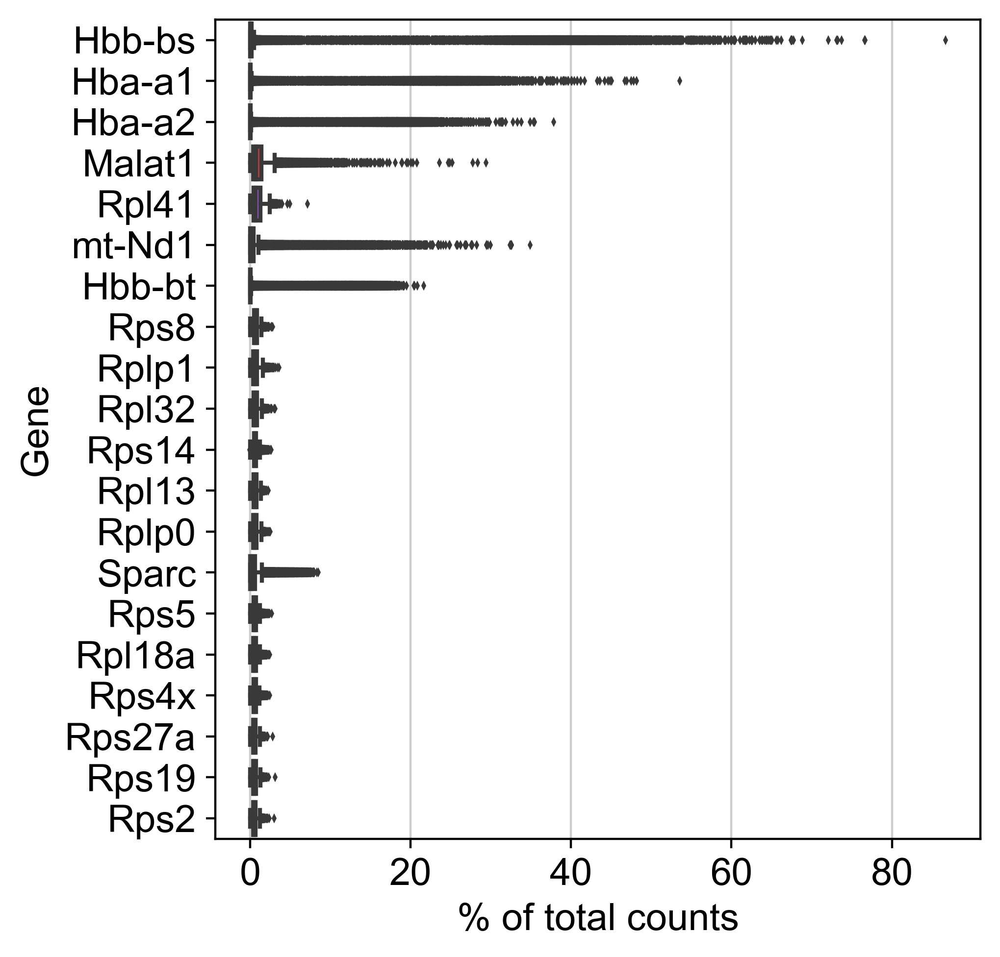

In [7]:
sc.pl.highest_expr_genes(adata, n_top=20)

In [8]:
adata.var['mt'] = adata.var_names.str.startswith('mt-')
sc.pp.calculate_qc_metrics(adata,qc_vars=['mt'], percent_top=None,log1p=False,inplace=True)

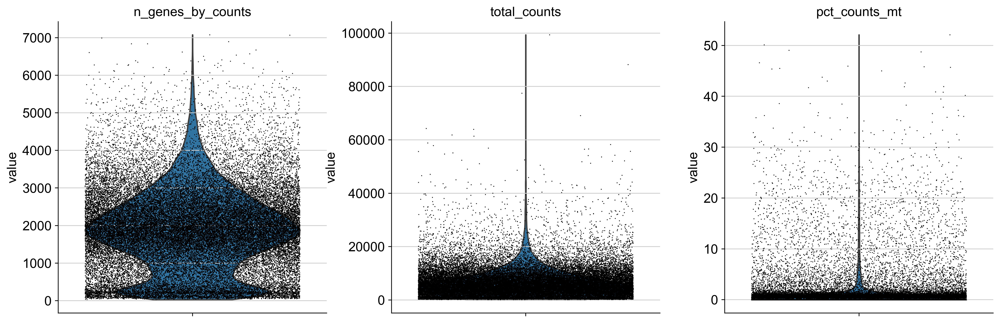

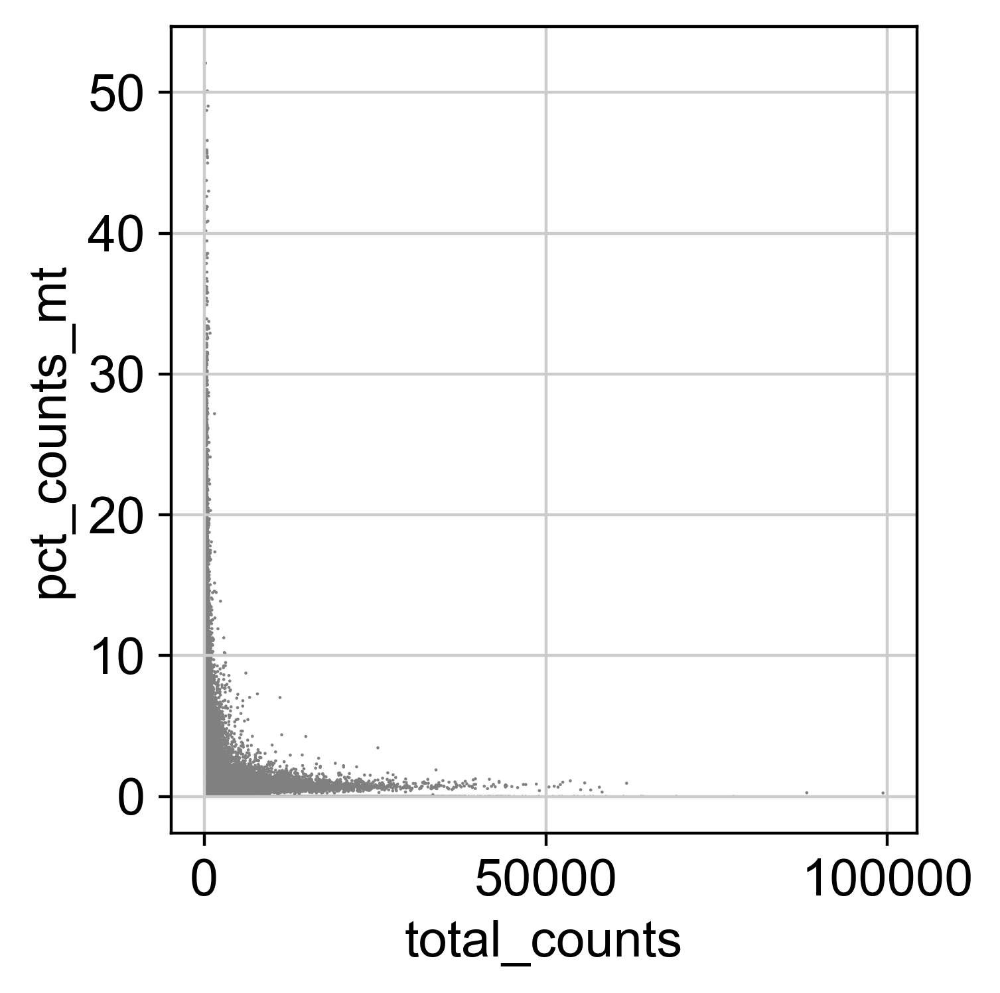

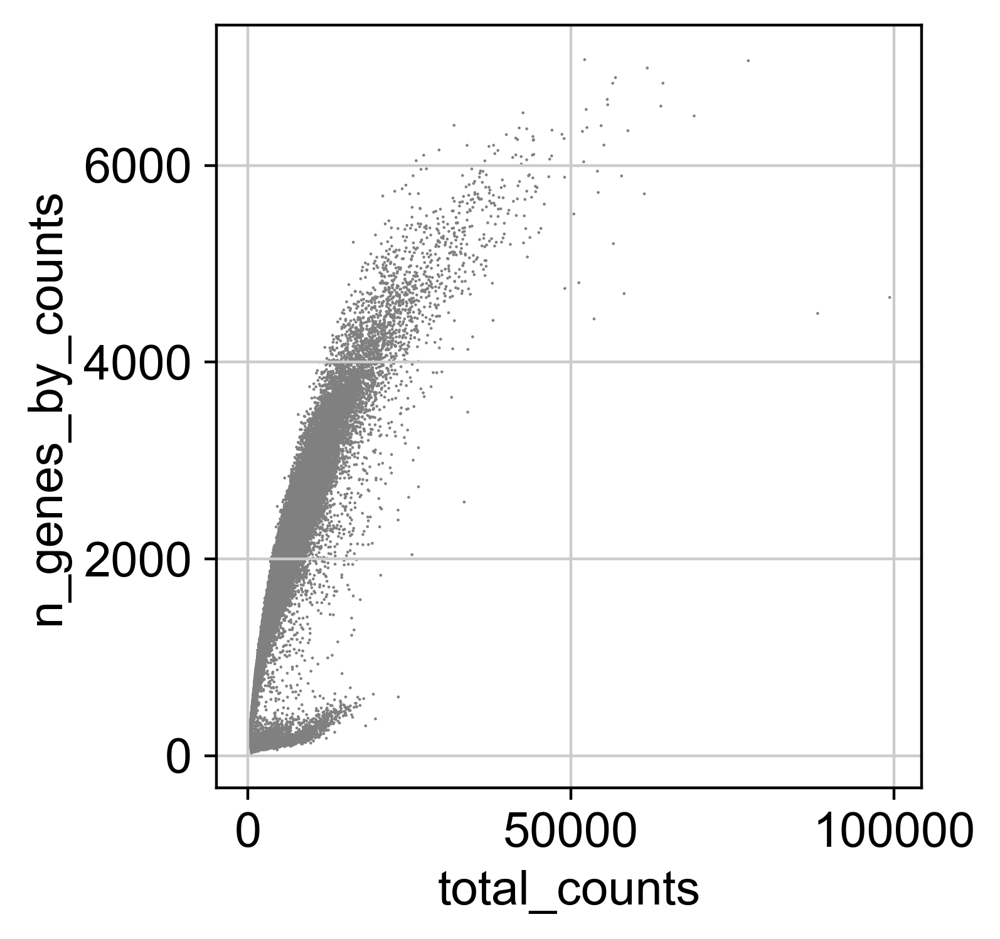

In [9]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [10]:
adata = adata[adata.obs.n_genes_by_counts < 5000, :]
adata = adata[adata.obs.n_genes_by_counts > 700, :]
adata = adata[adata.obs.pct_counts_mt < 10, :]

In [11]:
sc.pp.normalize_total(adata)

In [12]:
sc.pp.log1p(adata)

In [13]:
sc.pp.highly_variable_genes(adata, n_top_genes=4000)

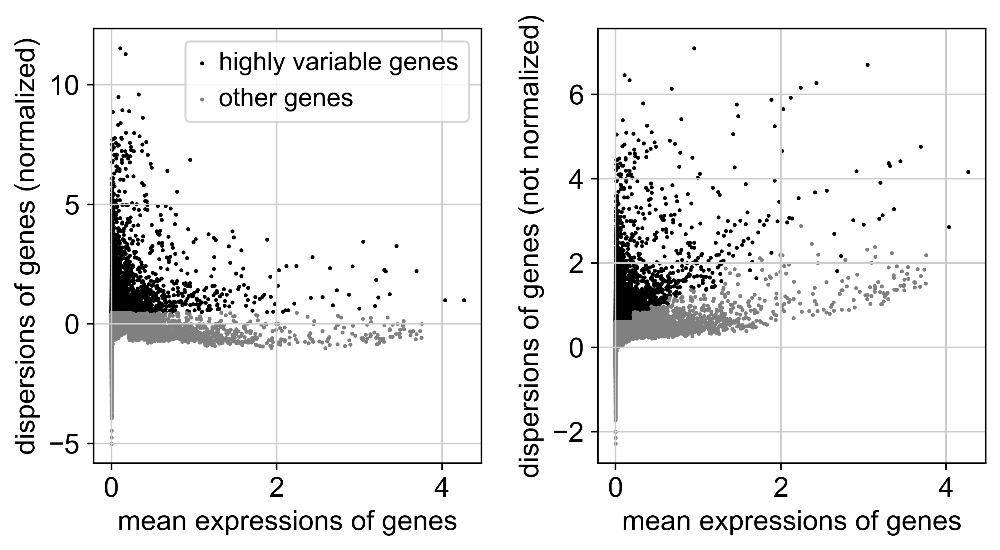

In [14]:
sc.pl.highly_variable_genes(adata)

In [15]:
var_genes=adata.var.highly_variable

In [16]:
#sc.pp.scale(adata, max_value=10)

In [17]:
batches = adata.obs['Time'].cat.categories.tolist()
alldata = {}
for batch in batches:
    alldata[batch] = adata[adata.obs['Time'] == batch,]

In [18]:
#subset the individual dataset to the same variable genes as in MNN-correct.
alldata2 = dict()
for ds in alldata.keys():
    print(ds)
    alldata2[ds] = alldata[ds][:,var_genes]

#convert to list of AnnData objects
adatas = list(alldata2.values())

# run scanorama.integrate
scanorama.integrate_scanpy(adatas, dimred = 50)

E14
E17
P5
Found 4000 genes among all datasets
[[0.         0.46777113 0.06405039]
 [0.         0.         0.44285118]
 [0.         0.         0.        ]]
Processing datasets (0, 1)
Processing datasets (1, 2)


In [19]:
adatas[0].obsm['X_scanorama'].shape

(10320, 50)

In [20]:
# Get all the integrated matrices.
scanorama_int = [ad.obsm['X_scanorama'] for ad in adatas]

# make into one matrix.
all_s = np.concatenate(scanorama_int)
print(all_s.shape)

# add to the AnnData object
adata.obsm["Scanorama"] = all_s

(35935, 50)


In [21]:
#umap
sc.pp.neighbors(adata, n_pcs =50, use_rep = "Scanorama")
sc.tl.umap(adata)

In [22]:
sc.tl.leiden(adata,resolution=0.1)

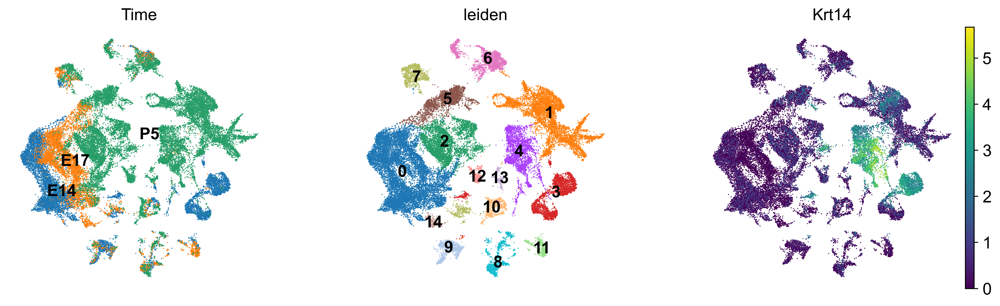

In [24]:
sc.pl.umap(adata,color=['Time','leiden','Krt14'],frameon=False,legend_loc="on data")

In [26]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')

In [27]:
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(20)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,Dlk1,Lgals7,Sparc,Rps26,Krt14,Ebf1,Cldn5,Ndufa4l2,Tmsb4x,Cdkn1c,Plp1,Cpa3,Mylk,Pmel,Car3
1,Lgals1,Krt28,Mfap4,Rplp2,Krt17,Malat1,Gng11,Rgs5,Laptm5,Capn6,Dbi,Srgn,Myl9,Dct,Adipoq
2,Col1a1,Perp,Mfap2,Rpl36,Fxyd3,Inhba,Pecam1,Cox4i2,B2m,Rpl37,Cryab,Hdc,Mef2c,Ptgds,Cox8a
3,Tmsb10,S100a14,Ppic,S100a11,Krt5,Rspo3,Cdh5,Gng11,Tyrobp,Ppp1r14b,Vim,Cma1,Myl6,Mlana,Uqcr11
4,Ifitm2,Emp2,Col1a2,Mif,Lgals7,Fgfr1,Cav1,Gucy1a1,Fcer1g,Actc1,Pcbp4,Rac2,Tpm2,Bace2,Hspd1
5,Nme2,mt-Nd1,Fstl1,Rps25,Ucp2,Enpp2,Ecscr,Mylk,Cyba,Itm2a,Sox10,Fcer1g,Ramp1,Syngr1,Plin1
6,Tuba1a,Krt25,Ramp1,Klf5,Krt15,Trps1,Cavin2,Des,Coro1a,Cox8a,Mpz,Tyrobp,Cdkn2c,Slc24a5,Arxes2
7,H19,Slc25a5,Col1a1,Rpl37,Barx2,Cd24a,Kdr,Ebf1,Ptpn18,Tubb2b,Mal,Cmtm7,Actg2,Mcoln3,Hspe1
8,Col1a2,Tacstd2,Anxa5,Rpl27,Sdc4,Wif1,Crip2,Ptp4a3,Fth1,Rpl26,Arpc1b,Ftl1,Acta2,Mitf,Arxes1
9,Col3a1,Sfn,Col3a1,Rpl37a,S100a14,Prss12,Tmsb4x,Crip1,Rac2,Rpl36,Gas7,Slc7a5,Calm1,Atp1a1,G0s2


In [28]:
sc.tl.dendrogram(adata,groupby='Cell Type',use_rep='Scanorama')

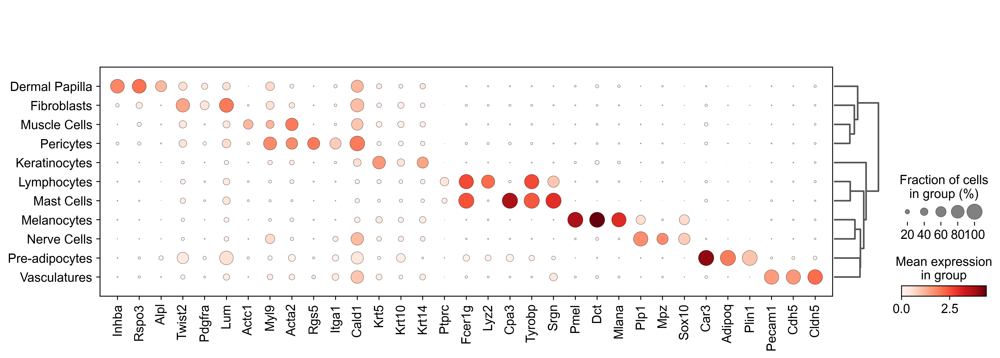

In [36]:
sc.pl.dotplot(adata, ['Inhba','Rspo3','Alpl',
                      'Twist2','Pdgfra','Lum',
                      'Actc1','Myl9','Acta2',
                      'Rgs5','Itga1','Cald1',
                      'Krt5','Krt10','Krt14',
                      'Ptprc','Fcer1g','Lyz2',
                      'Cpa3','Tyrobp','Srgn',
                      'Pmel','Dct','Mlana',
                      'Plp1','Mpz','Sox10',
                      'Car3','Adipoq','Plin1',
                      'Pecam1','Cdh5','Cldn5'
                      ],'Cell Type', dendrogram=True)

In [25]:
clusterid ={
    '0' : 'Fibroblasts' ,
    '1' : 'Keratinocytes',
    '2' : 'Fibroblasts',
    '3' : 'Keratinocytes',
    '4' : 'Keratinocytes',
    '5' : 'Dermal Papilla',
    '6' : 'Vasculatures',
    '7' : 'Pericytes',
    '8' : 'Lymphocytes',
    '9' : 'Muscle Cells',
    '10' : 'Nerve Cells',
    '11' : 'Mast Cells',
    '12' : 'Muscle Cells',
    '13' : 'Melanocytes',
    '14' : 'Pre-adipocytes'
}
adata.obs['Cell Type'] = adata.obs['leiden'].map(clusterid).astype('category')

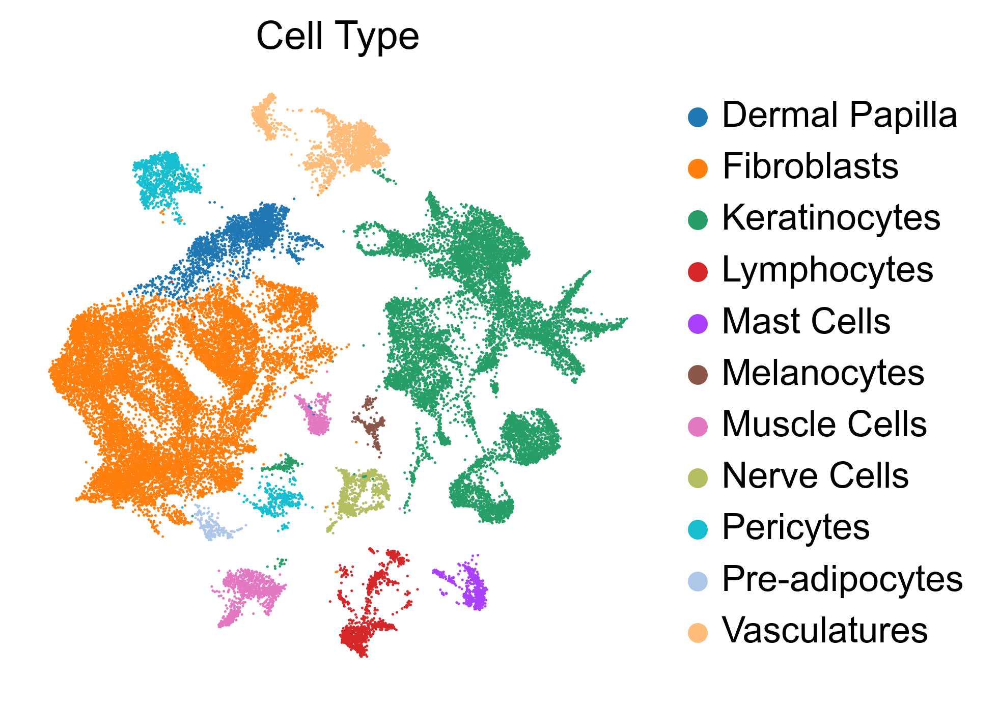

In [26]:
sc.pl.umap(adata,color=['Cell Type'],frameon=False)

In [24]:
fib = adata[adata.obs['leiden'].isin(['0','1','3','5','7','10','22'])]

In [25]:
fib

View of AnnData object with n_obs × n_vars = 17572 × 29828
    obs: 'Clusters', '_X', '_Y', 'Time', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'Accession-E14', 'Chromosome-E14', 'End-E14', 'Start-E14', 'Strand-E14', 'Accession-E17', 'Chromosome-E17', 'End-E17', 'Start-E17', 'Strand-E17', 'Accession-P5', 'Chromosome-P5', 'End-P5', 'Start-P5', 'Strand-P5', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'neighbors', 'umap', 'leiden', 'Time_colors', 'leiden_colors'
    obsm: 'Scanorama', 'X_umap'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'

In [26]:
batches = fib.obs['Time'].cat.categories.tolist()
alldata = {}
for batch in batches:
    alldata[batch] = fib[fib.obs['Time'] == batch,]

In [27]:
#subset the individual dataset to the same variable genes as in MNN-correct.
alldata2 = dict()
for ds in alldata.keys():
    print(ds)
    alldata2[ds] = alldata[ds][:,var_genes]

#convert to list of AnnData objects
adatas = list(alldata2.values())

# run scanorama.integrate
scanorama.integrate_scanpy(adatas, dimred = 50)

E14
E17
P5
Found 4000 genes among all datasets
[[0.         0.44575746 0.        ]
 [0.         0.         0.39577683]
 [0.         0.         0.        ]]
Processing datasets (0, 1)
Processing datasets (1, 2)


In [28]:
adatas[0].obsm['X_scanorama'].shape

(5809, 50)

In [29]:
# Get all the integrated matrices.
scanorama_int = [ad.obsm['X_scanorama'] for ad in adatas]

# make into one matrix.
all_s = np.concatenate(scanorama_int)
print(all_s.shape)

# add to the AnnData object
fib.obsm["Scanorama"] = all_s

(17572, 50)


In [30]:
#umap
sc.pp.neighbors(fib, n_pcs =30, use_rep = "Scanorama")
sc.tl.umap(fib)

In [31]:
sc.tl.leiden(fib,resolution=1)

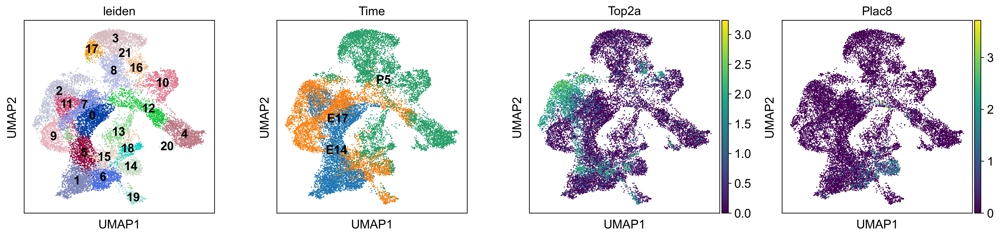

In [32]:
sc.pl.umap(fib,color=['leiden','Time','Top2a','Plac8'],legend_loc='on data')

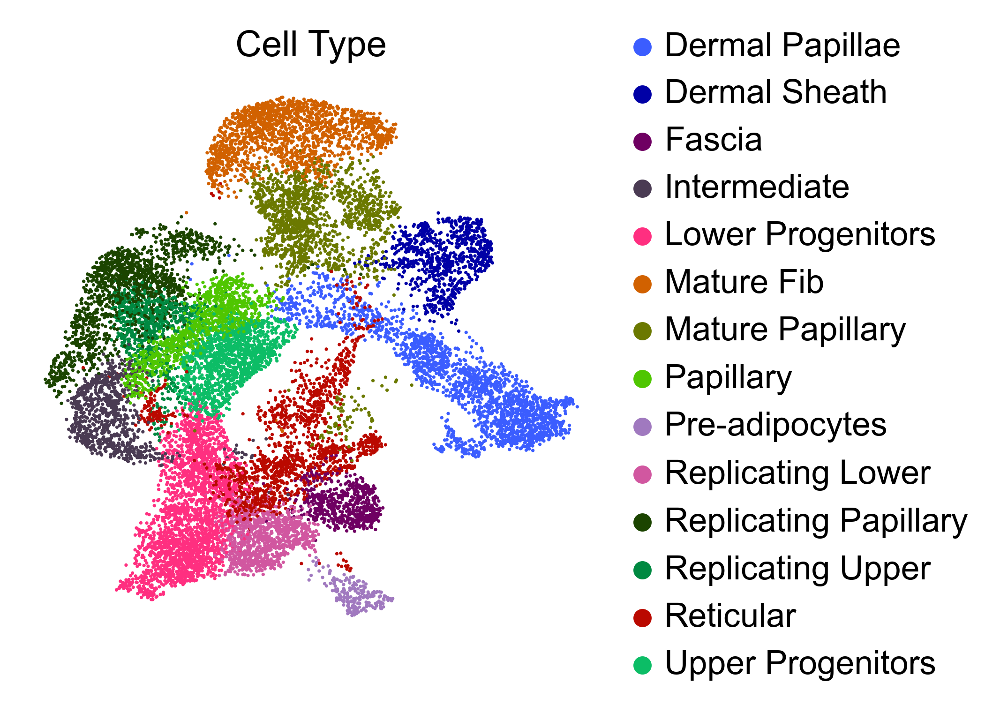

In [46]:
sc.pl.umap(fib,color=['Cell Type'],frameon=False)

In [33]:
clusterid ={
    '0' : 'Upper Progenitors' ,
    '1' : 'Lower Progenitors',
    '2' : 'Replicating Papillary',
    '3' : 'Mature Fib',
    '4' : 'Dermal Papillae',
    '5' : 'Lower Progenitors',
    '6' : 'Replicating Lower',
    '7' : 'Papillary',
    '8' : 'Mature Papillary',
    '9' : 'Intermediate',
    '10' : 'Dermal Sheath',
    '11' : 'Replicating Upper',
    '12' : 'Dermal Papillae',
    '13' : 'Reticular',
    '14' : 'Fascia',
    '15' : 'Reticular',
    '16' : 'Mature Papillary',
    '17' : 'Mature Fib',
    '18' : 'Reticular',
    '19' : 'Pre-adipocytes',
    '20' : 'Dermal Papillae',
    '21' : 'Mature Papillary'
}
fib.obs['Cell Type'] = fib.obs['leiden'].map(clusterid).astype('category')

In [34]:
sc.tl.dendrogram(fib, use_rep='Scanorama',groupby='Cell Type')

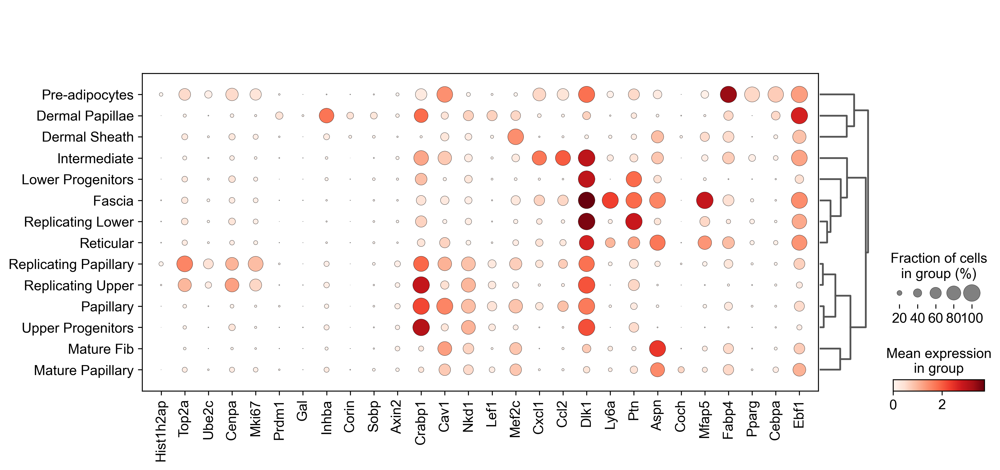

In [35]:
sc.pl.dotplot(fib, ['Hist1h2ap','Top2a','Ube2c','Cenpa','Mki67','Prdm1','Gal','Inhba','Corin','Sobp','Axin2','Crabp1','Cav1','Nkd1','Lef1','Mef2c','Cxcl1','Ccl2','Dlk1',
            'Ly6a','Ptn','Aspn','Coch','Mfap5','Fabp4','Pparg','Cebpa','Ebf1'],'Cell Type', dendrogram=True)

In [42]:
df = adata.obs.groupby(['Time']).agg(mean_n_genes = ("n_genes_by_counts",'mean'))

In [62]:
sc.tl.rank_genes_groups(fib, 'Cell Type', method='wilcoxon')

In [92]:
dfct=pd.DataFrame(fib.uns['rank_genes_groups']['names']).head(100)

In [93]:
dfct.to_csv('DEG100.csv')

In [36]:
lineid = {
    'Upper Progenitors' : 'Upper',
    'Replicating Upper' : 'Upper',
    'Replicating Papillary' : 'Upper',
    'Papillary' : 'Upper',
    'Dermal Papillae' : 'Upper',
    'Dermal Sheath' : 'Upper',
    'Lower Progenitors' : 'Lower',
    'Replicating Lower' : 'Lower',
    'Reticular' : 'Lower',
    'Intermediate' : 'Lower',
    'Pre-adipocytes': 'Lower',
    'Fascia' : 'Lower'}
fib.obs['Lineage'] = fib.obs['Cell Type'].map(lineid).astype('category')

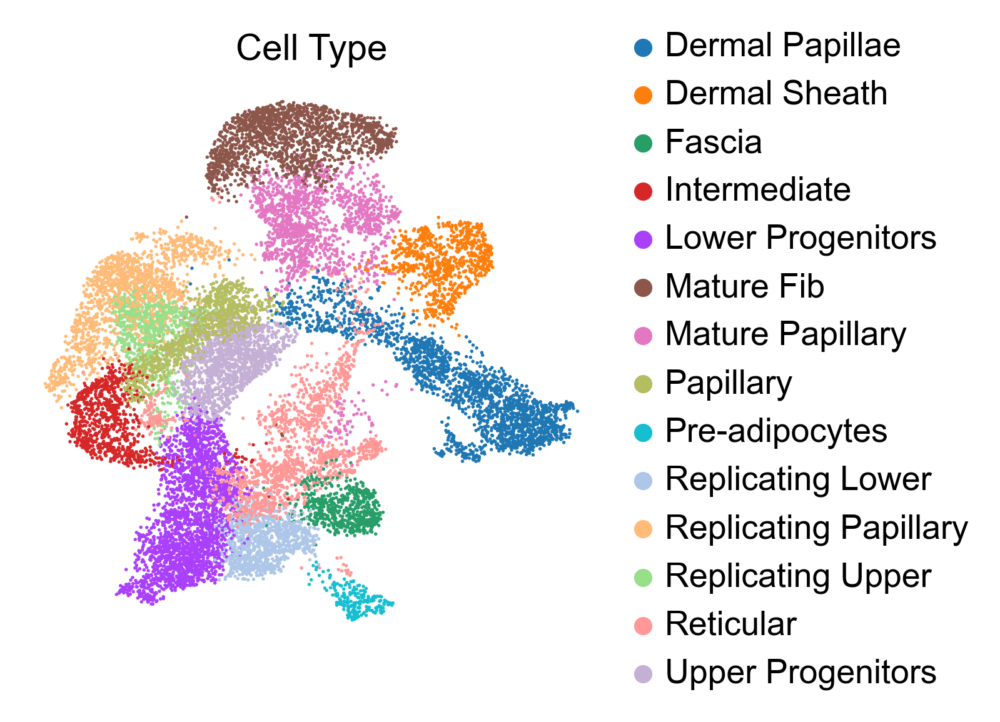

In [49]:
sc.pl.umap(fib, color= ['Cell Type'], frameon=False,cmap='magma')

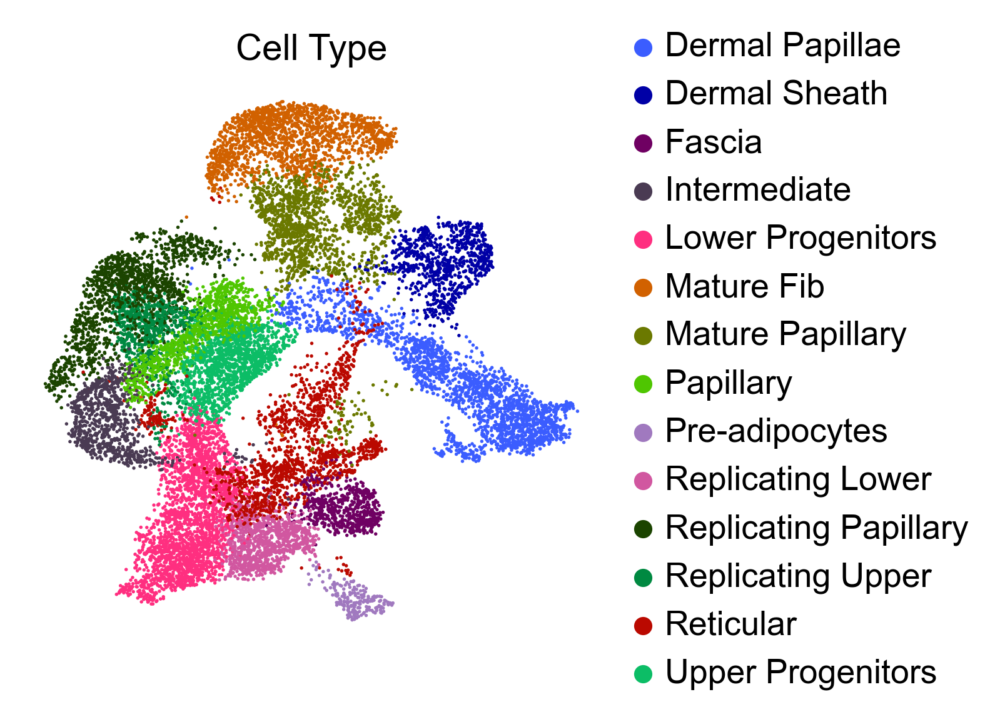

In [42]:
sc.pl.umap(fib,color=['Cell Type'],frameon=False,cmap='magma')

In [39]:
godsnot102 = np.array(sc.pl.palettes.godsnot_102)
new_colors = np.array(fib.uns['Cell Type_colors'])

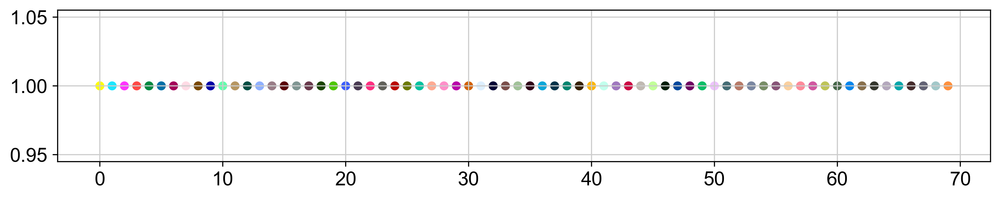

In [40]:
plt.figure(figsize=(12, 2))
for i in range(70):
    plt.scatter(i, 1, c=sc.pl.palettes.godsnot_102[i], s=30)
plt.show()

In [41]:
new_colors[[0]] = godsnot102[[20]] #DP
new_colors[[1]] = godsnot102[[9]] #DS
new_colors[[2]] = godsnot102[[48]] #Fascia
new_colors[[3]] = godsnot102[[21]] #intermediate
new_colors[[4]] = godsnot102[[22]] #Lower Prog
new_colors[[5]] = godsnot102[[30]] #Mature Fib
new_colors[[6]] = godsnot102[[25]] #Mature Pap
new_colors[[7]] = godsnot102[[19]] #Papillary
new_colors[[8]] = godsnot102[[42]] #Pre-adipocytes
new_colors[[9]] = godsnot102[[58]] #Rep Lower
new_colors[[10]] = godsnot102[[18]] #Rep Pap
new_colors[[11]] = godsnot102[[4]] #Rep Upp
new_colors[[12]] = godsnot102[[24]] #Retic
new_colors[[13]] = godsnot102[[49]] #Up Prog
fib.uns['Cell Type_colors']  = new_colors

In [43]:
fib.write_h5ad("final_fib_prevelo.h5ad")